In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import random
import seaborn as sns

import torchvision
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from einops import rearrange

import matplotlib.gridspec as gridspec


%matplotlib inline
%config InlineBackend.figure_format = 'retina'

torch.Size([3, 750, 1061])


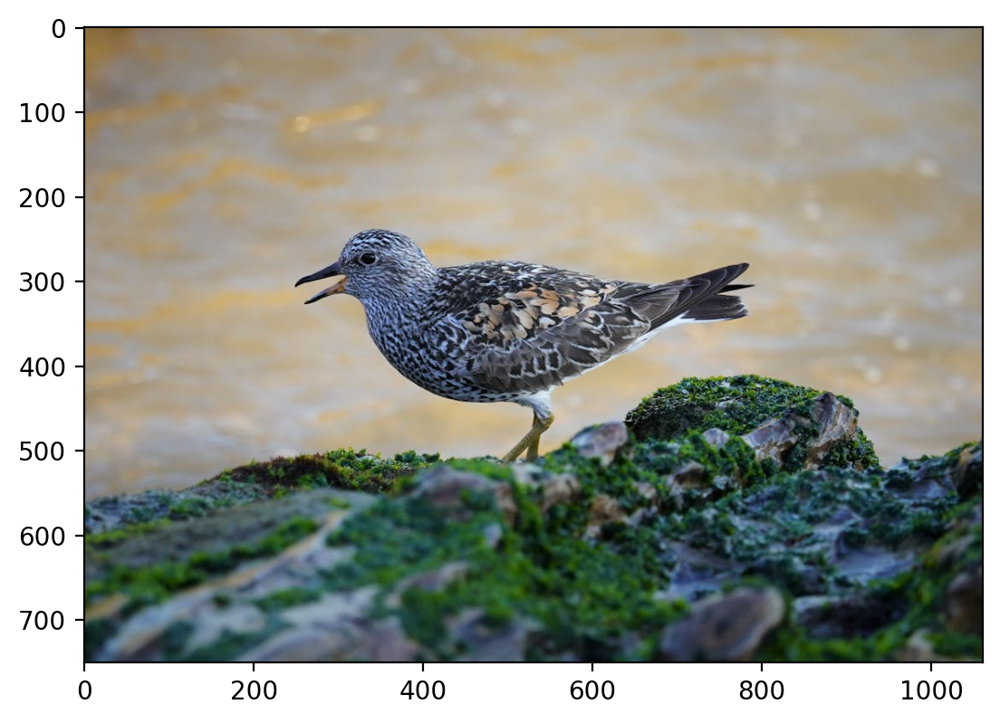

In [3]:
img = torchvision.io.read_image("image.jpeg")
# img = data.astronaut()
print(img.shape)
plt.imshow(img.permute(1, 2, 0))
plt.show()

Cropping the image to 400X400

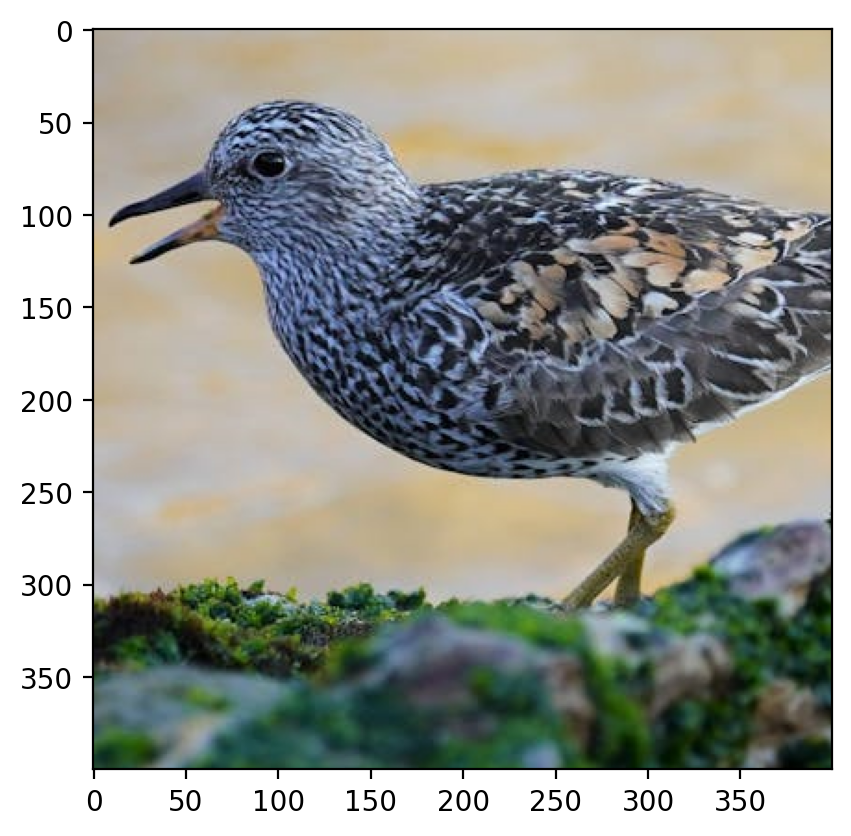

In [4]:
crop = torchvision.transforms.functional.crop(img, 200,240, 400, 400)
plt.imshow(crop.permute(1,2,0))

In [5]:
crop.shape


torch.Size([3, 400, 400])

Matrix Factorization

In [6]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
def factorize(A, r, device=torch.device("cpu")):

    A = A.to(device)
    # Randomly initialize W and H
    W = torch.randn(A.shape[0], r, requires_grad=True, device=device)
    H = torch.randn(r, A.shape[1], requires_grad=True, device=device)

    # Optimizer
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A)
    # Train the model
    for i in range(1000):
        # Compute the loss
        diff_matrix = torch.mm(W,H)-A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)

        # Zero the gradients
        optimizer.zero_grad()

        # Backpropagate
        loss.backward()

        # Update the parameters
        optimizer.step()

    return W, H, loss

Predicting image for Different Ranks

Rank is 50
Losses  are (R,G,B) = (4645.40185546875,4684.6904296875,4753.50634765625) 
loss sum: (tensor(9330.0918, grad_fn=<AddBackward0>), tensor(4753.5063, grad_fn=<LinalgVectorNormBackward0>))


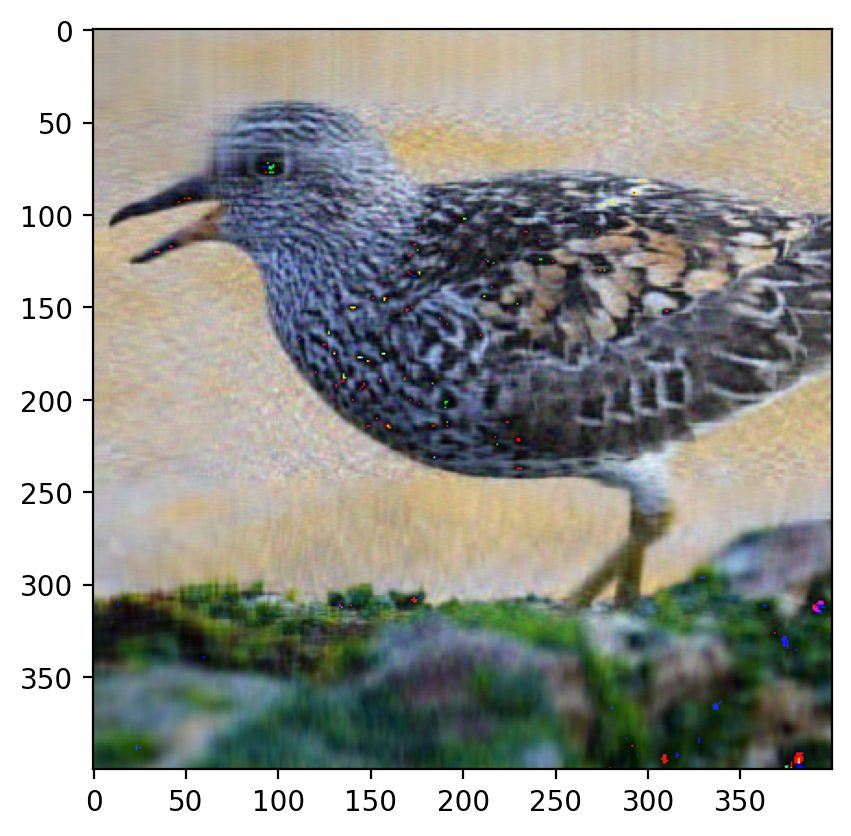

Rank is 150
Losses  are (R,G,B) = (1017.61181640625,1010.3456420898438,1006.7110595703125) 
loss sum: (tensor(2027.9575, grad_fn=<AddBackward0>), tensor(1006.7111, grad_fn=<LinalgVectorNormBackward0>))


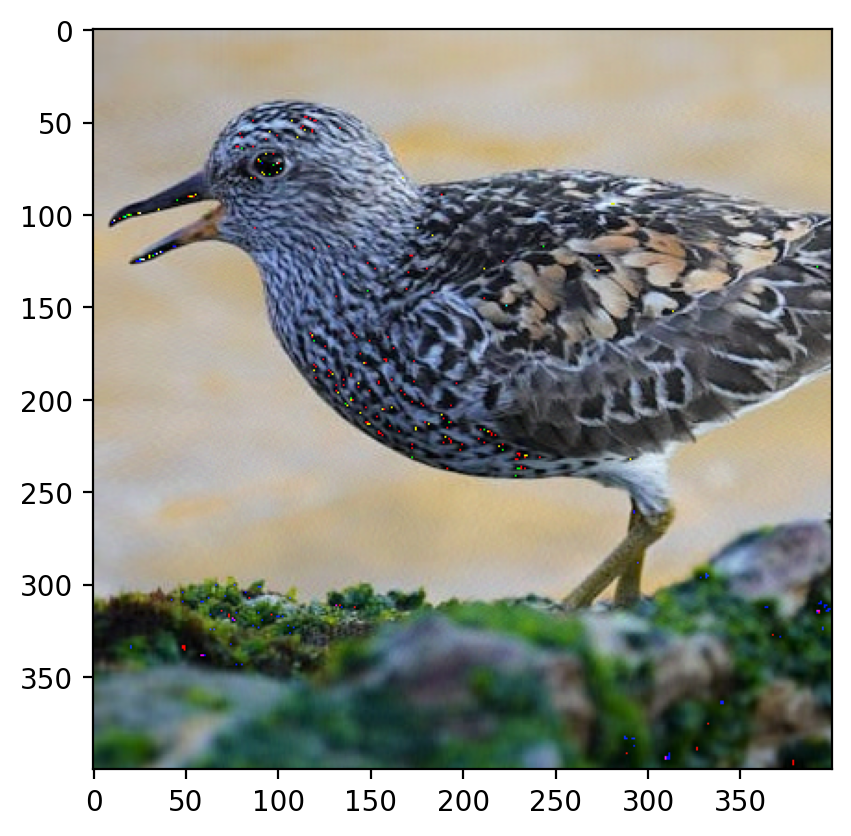

Rank is 250
Losses  are (R,G,B) = (226.85919189453125,227.34181213378906,227.53680419921875) 
loss sum: (tensor(454.2010, grad_fn=<AddBackward0>), tensor(227.5368, grad_fn=<LinalgVectorNormBackward0>))


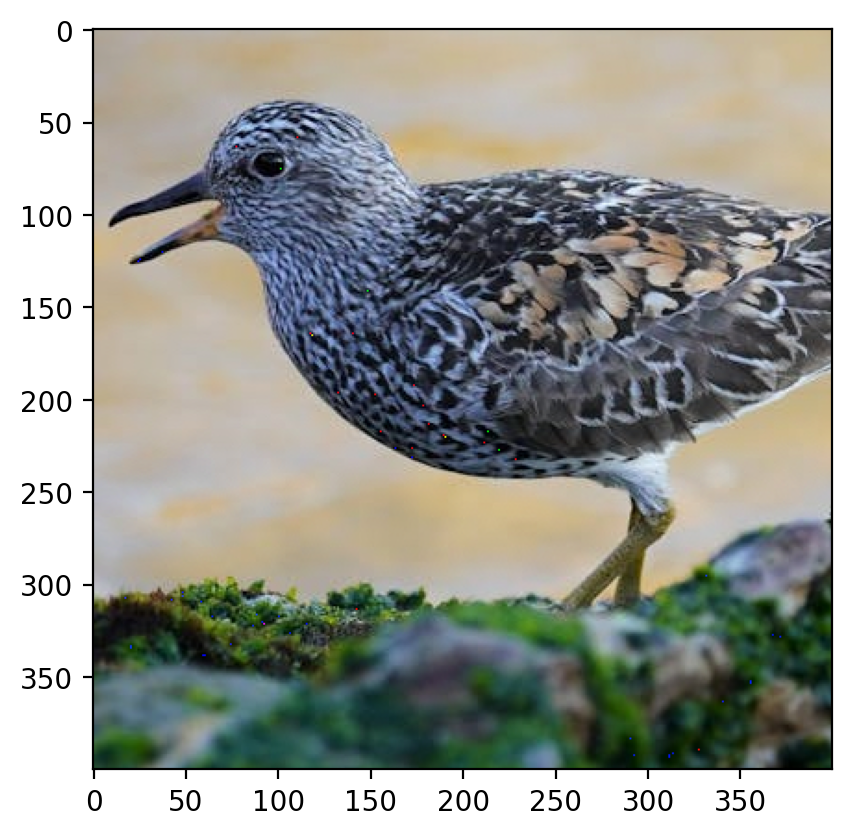

In [7]:

for rank in range(50,300,100):
    # rank = 50
    R = crop[0, :, :]  # Red channel
    G = crop[1, :, :]  # Green channel
    B = crop[2, :, :]  # Blue channel

    U_R, V_R, loss_R = factorize(R, rank)
    U_G, V_G, loss_G = factorize(G, rank)
    U_B, V_B, loss_B = factorize(B, rank)

    # Reconstruct the channels
    R_reconst = np.dot(U_R.detach().numpy(), V_R.detach().numpy())
    G_reconst = np.dot(U_G.detach().numpy(), V_G.detach().numpy())
    B_reconst = np.dot(U_B.detach().numpy(), V_B.detach().numpy())

    # Stack the channels back into a color image
    img_reconst = np.stack([R_reconst, G_reconst, B_reconst], axis=2).astype(np.uint8)
    # img_reconst = torch.tensor(img_reconst, dtype=torch.uint8)


    # img_reconst= [R_reconst, G_reconst, B_reconst]
    print(f"Rank is {rank}")
    print(f"Losses  are (R,G,B) = ({loss_R},{loss_G},{loss_B}) ")
    print(f"loss sum: {loss_R + loss_G, loss_B}")
    plt.imshow(img_reconst)
    plt.show()


Rank is 250
Losses  are (R,G,B) = (226.85919189453125,227.34181213378906,227.53680419921875) 
loss sum: (tensor(454.2010, grad_fn=<AddBackward0>), tensor(227.5368, grad_fn=<LinalgVectorNormBackward0>))


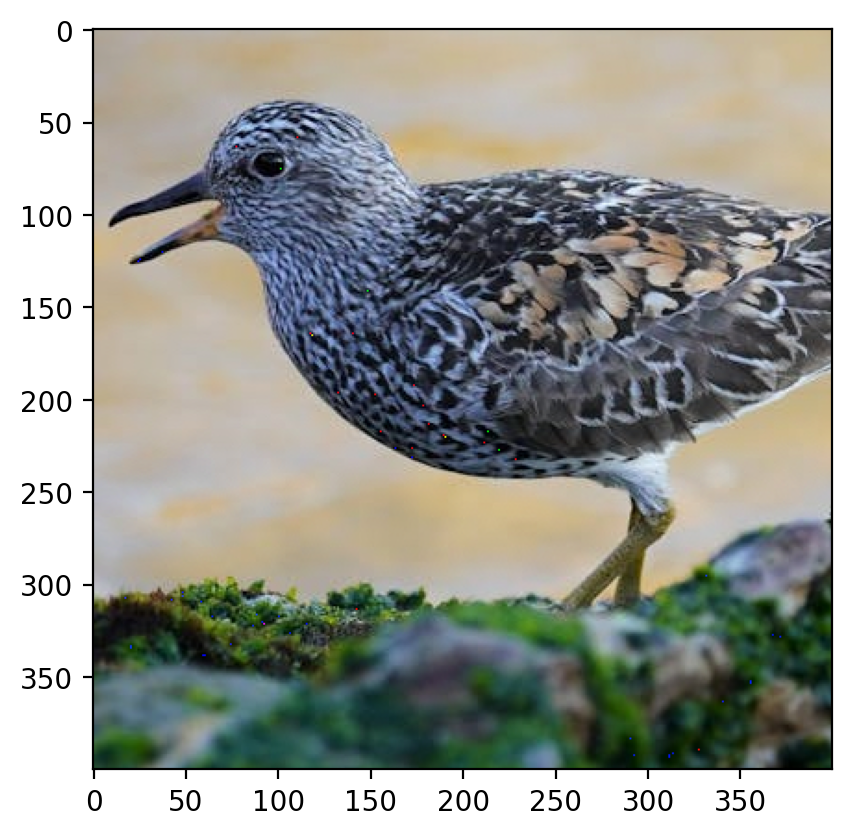

In [8]:
print(f"Rank is {rank}")
print(f"Losses  are (R,G,B) = ({loss_R},{loss_G},{loss_B}) ")
print(f"loss sum: {loss_R + loss_G, loss_B}")
plt.imshow(img_reconst)
plt.show()

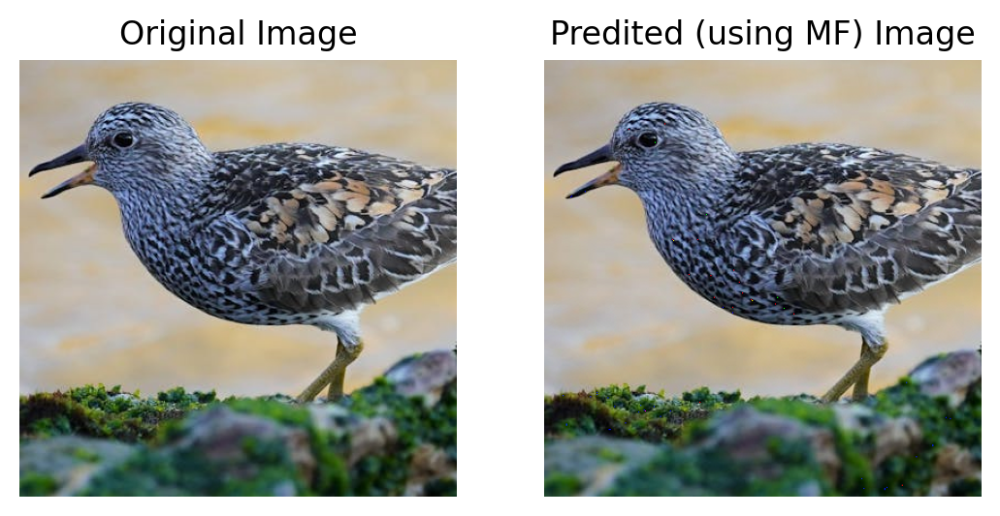

In [9]:
# pred_img = torch.mm(W,H).cpu().detach().numpy()
# plt.figure(figsize=(100,300))
plt.subplot(1,2,1)
plt.imshow(crop.permute(1,2,0))
plt.title("Original Image")
plt.axis("off")
plt.subplot(1,2,2)
plt.imshow(img_reconst)
plt.title("Predited (using MF) Image")
plt.axis("off")
plt.show()


Function for finding RMSE and PSNR values

In [10]:

def rmse_psnr(org, pred):
    if isinstance(org, np.ndarray):
        org = torch.from_numpy(org)
    if isinstance(pred, np.ndarray):
        pred = torch.from_numpy(pred)
    squared_diff = (org.float() - pred.float()) ** 2

    mse = torch.mean(squared_diff)
    rmse = torch.sqrt(mse)    
    
    max_pixel_value = 255.0

    psnr = 20 * np.log10(max_pixel_value / rmse)
    
    return rmse, psnr


In [11]:
rmse,psnr = rmse_psnr(crop.permute(1,2,0),img_reconst)

C:\Users\Student\AppData\Local\Temp\ipykernel_42264\3025875977.py:13: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  psnr = 20 * np.log10(max_pixel_value / rmse)


RMSE and PSNR values

In [12]:

print(f"rmse: {rmse} , psnr: {psnr}")

rmse: 2.951231002807617 , psnr: 38.73073959350586


# Question 2

In [13]:
img2 = torchvision.io.read_image("image.jpeg")
print(img2.shape)

torch.Size([3, 750, 1061])


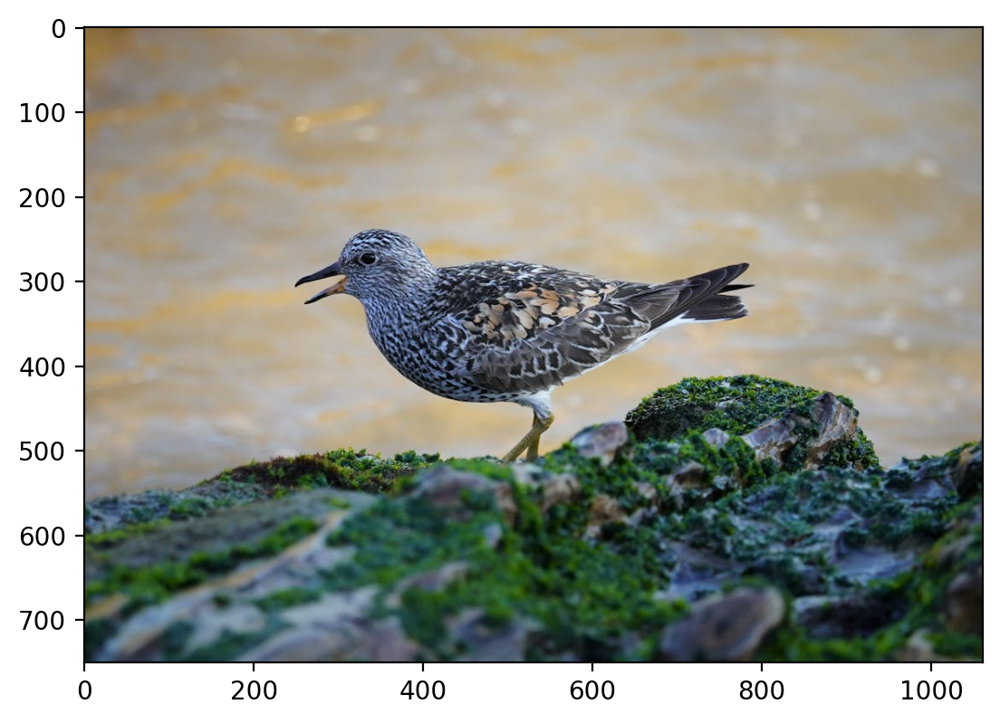

In [14]:
plt.imshow(img2.permute(1,2,0))

 Permute is use to change the dimension ((200,200,3) --> (3,200,200))

torch.Size([3, 200, 200])

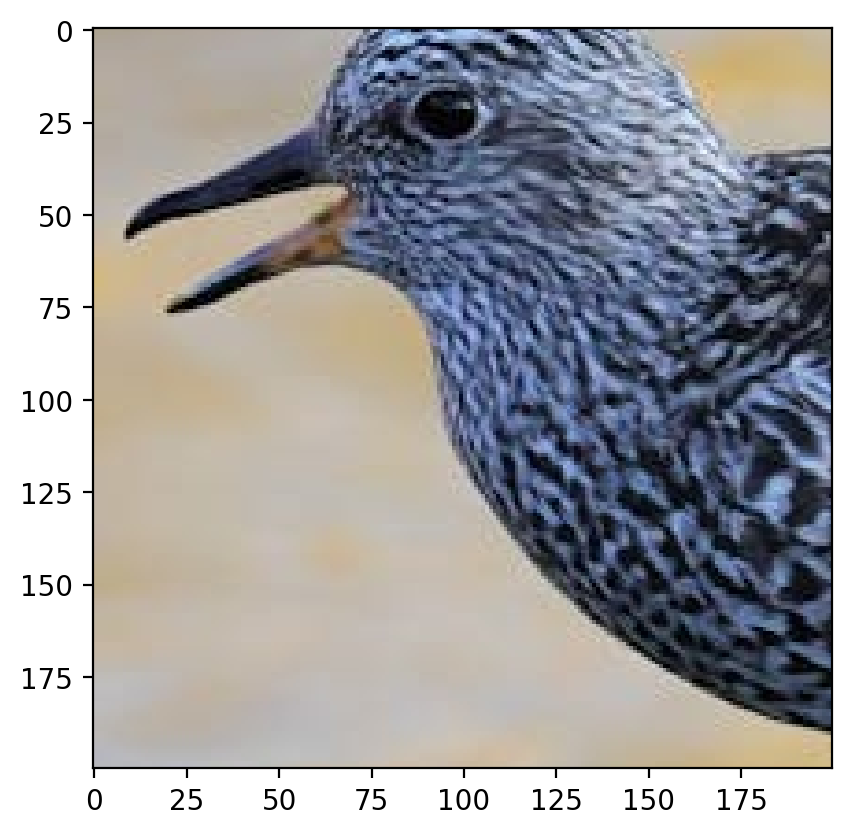

In [15]:
c_img = torchvision.transforms.functional.crop(img2, 250,240, 200, 200)
plt.imshow(c_img.permute(1,2,0))
c_img.shape

In [30]:
c_img.permute(1,2,0).shape

torch.Size([200, 200, 3])

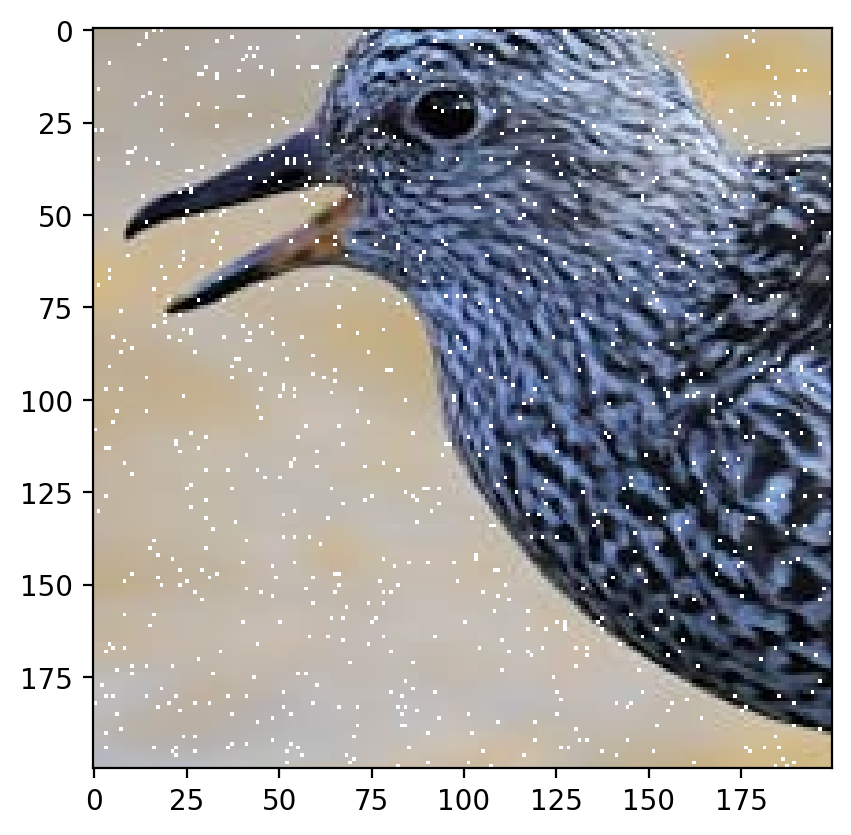

In [16]:
def img_pix_rm(i_img, num_pixels):
    img = i_img.clone().float()
    _, height, width = img.shape  

    total_pixels = height * width
    num_pixels = min(num_pixels, total_pixels)
    
    pixels_to_remove = torch.randperm(total_pixels)[:num_pixels]
    
    row_indices = pixels_to_remove // width
    col_indices = pixels_to_remove % width

    for channel in range(3):
        img[channel, row_indices, col_indices] = float('nan')
    
    return img

m_img = img_pix_rm(c_img,900)
# m_img
plt.imshow(m_img.permute(1, 2, 0).cpu().numpy() / 255)

# Using Matrix Factorisation

Rank is 50
Losses  are (R,G,B) = (1644.0018310546875,1662.785888671875,1701.8592529296875) 
loss sum: (tensor(3306.7876, grad_fn=<AddBackward0>), tensor(1701.8593, grad_fn=<LinalgVectorNormBackward0>))


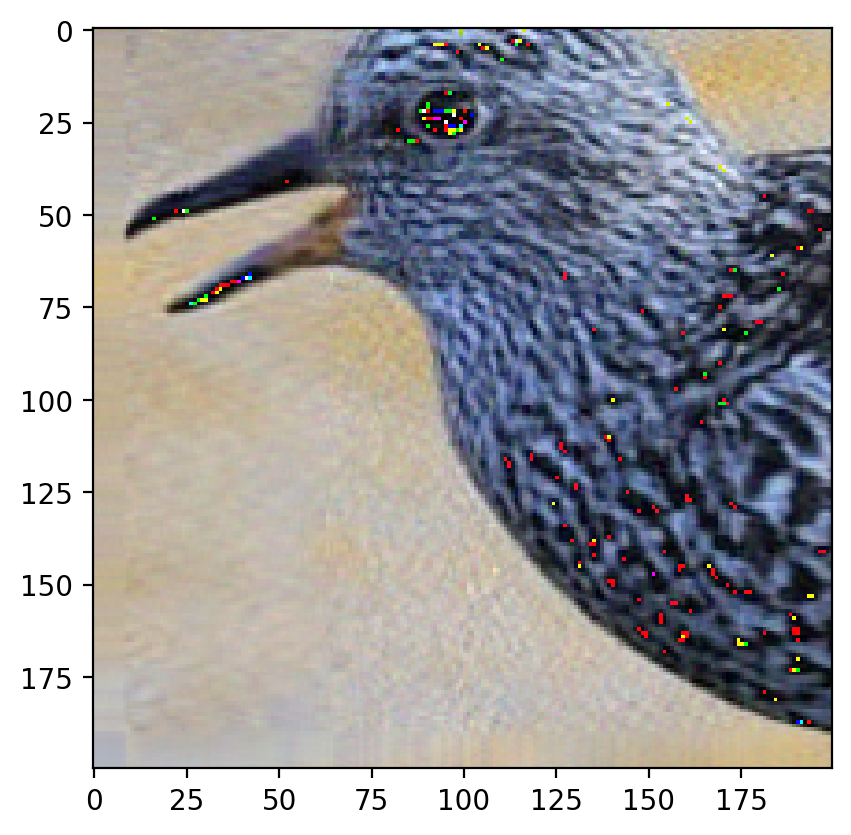

Rank is 150
Losses  are (R,G,B) = (64.81792449951172,62.50983428955078,62.181968688964844) 
loss sum: (tensor(127.3278, grad_fn=<AddBackward0>), tensor(62.1820, grad_fn=<LinalgVectorNormBackward0>))


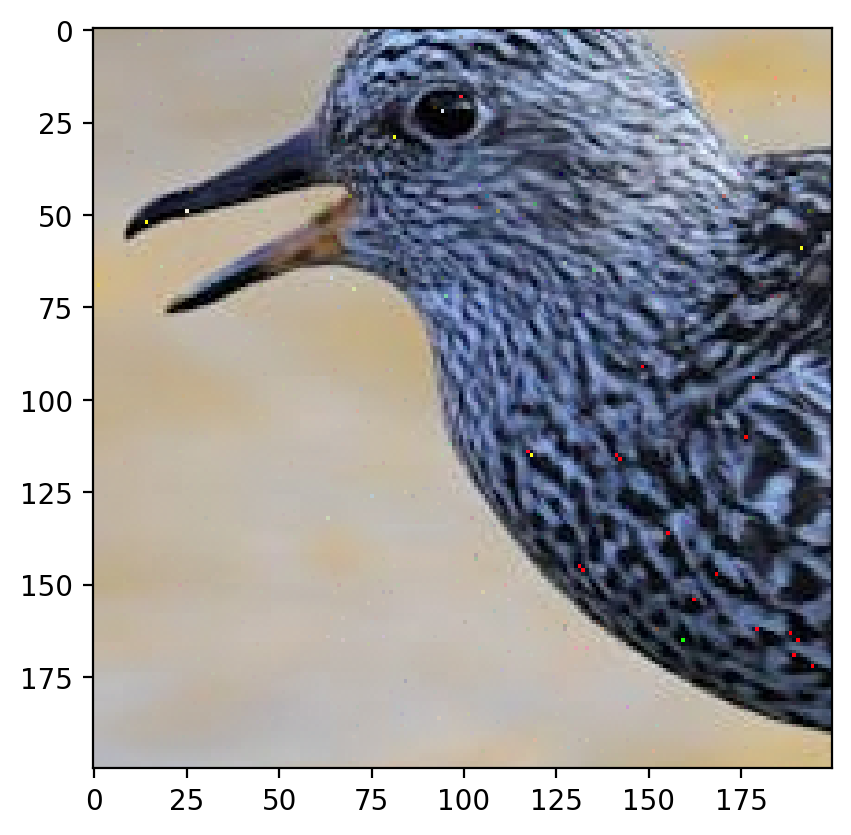

Rank is 250
Losses  are (R,G,B) = (32.43701934814453,24.211158752441406,36.2274055480957) 
loss sum: (tensor(56.6482, grad_fn=<AddBackward0>), tensor(36.2274, grad_fn=<LinalgVectorNormBackward0>))


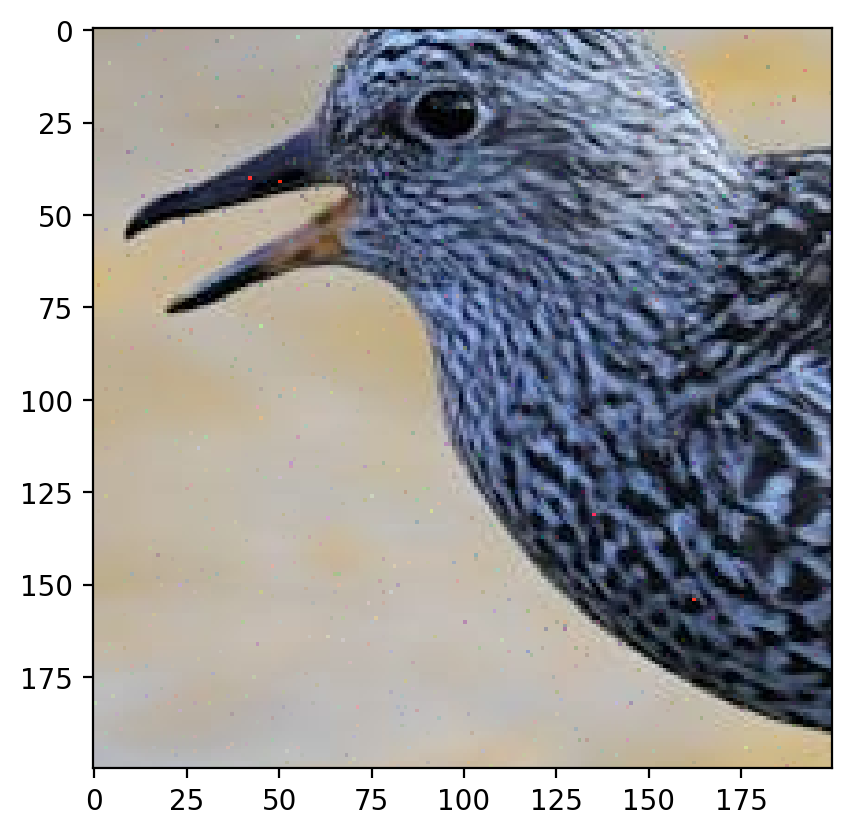

In [17]:
for rank in range(50,300,100):
# rank = 50
    R = m_img[0, :, :]
    G = m_img[1, :, :]
    B = m_img[2, :, :]

    U_R, V_R, loss_R = factorize(R, rank)
    U_G, V_G, loss_G = factorize(G, rank)
    U_B, V_B, loss_B = factorize(B, rank)

    R_rc = np.dot(U_R.detach().numpy(), V_R.detach().numpy())
    G_rc = np.dot(U_G.detach().numpy(), V_G.detach().numpy())
    B_rc = np.dot(U_B.detach().numpy(), V_B.detach().numpy())

    img_rc = np.stack([R_rc, G_rc, B_rc], axis=2).astype(np.uint8)
    print(f"Rank is {rank}")
    print(f"Losses  are (R,G,B) = ({loss_R},{loss_G},{loss_B}) ")
    print(f"loss sum: {loss_R + loss_G, loss_B}")
    plt.imshow(img_rc)
    plt.show()

In [18]:
rmse,psnr = rmse_psnr(c_img.permute(1,2,0),img_rc)


C:\Users\Student\AppData\Local\Temp\ipykernel_42264\3025875977.py:13: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  psnr = 20 * np.log10(max_pixel_value / rmse)


Below are the Losses, RMSE, PSNR values

In [19]:
print(f"Rank is {rank}")
print(f"Losses  are (R,G,B) = ({loss_R},{loss_G},{loss_B}) ")
print(f"loss sum: {loss_R + loss_G, loss_B}")
print(f"rmse is {rmse}, psnr is {psnr}")

Rank is 250
Losses  are (R,G,B) = (32.43701934814453,24.211158752441406,36.2274055480957) 
loss sum: (tensor(56.6482, grad_fn=<AddBackward0>), tensor(36.2274, grad_fn=<LinalgVectorNormBackward0>))
rmse is 3.6812667846679688, psnr is 36.81085968017578


900 pixel in each(r,g,b) are nan

In [20]:
torch.sum(torch.isnan(m_img)).item()

2700

# Using Random Fourier Features

In [21]:
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.kernel_approximation import RBFSampler

In [22]:
def rff_reconstruction(corrupted_image):
    x_train = []
    y_train = []
    for i in range(corrupted_image.shape[0]):
        for j in range(corrupted_image.shape[1]):
            if not np.isnan(corrupted_image[i, j]):
                x_train.append([i, j])
                y_train.append(corrupted_image[i, j])

    x_train = np.array(x_train)
    y_train = np.array(y_train)

    rbf_sampler = RBFSampler(gamma=1.0, n_components=3000)
    X_features = rbf_sampler.fit_transform(x_train, y_train)

    reg = LinearRegression().fit(X_features, y_train)

    x_test = [[i, j] for i in range(corrupted_image.shape[0]) for j in range(corrupted_image.shape[0])]
    X_test_features = rbf_sampler.transform(x_test)
    y_pred = reg.predict(X_test_features)

    reconstructed_image_rff = corrupted_image.clone()
    for idx, (i, j) in enumerate(x_test):
        if np.isnan(reconstructed_image_rff[i, j]):
            reconstructed_image_rff[i, j] = y_pred[idx]

    return reconstructed_image_rff

In [23]:
rff_r = rff_reconstruction(m_img[0])
rff_g = rff_reconstruction(m_img[1])
rff_b = rff_reconstruction(m_img[2])

C:\Users\Student\AppData\Local\Temp\ipykernel_42264\3808087236.py:6: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  if not np.isnan(corrupted_image[i, j]):
C:\Users\Student\AppData\Local\Temp\ipykernel_42264\3808087236.py:24: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  if np.isnan(reconstructed_image_rff[i, j]):
C:\Users\Student\AppData\Local\Temp\ipykernel_42264\3808087236.py:6: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  if not np.isnan(corrupted_image[i, j]):
C:\Users\Student\AppData\Local\Temp\ipykernel_42264\3808087236.py:24: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  if np.isnan(reconstructed_image_rff[i, j]):
C:

In [24]:
pred_img_rff = np.stack([rff_r, rff_g, rff_b], axis=2).astype(np.uint8)

In [25]:
# pred_img_m = torch.mm(w,h).cpu().detach().numpy()

Text(0.5, 1.0, 'RFF predicted Image')

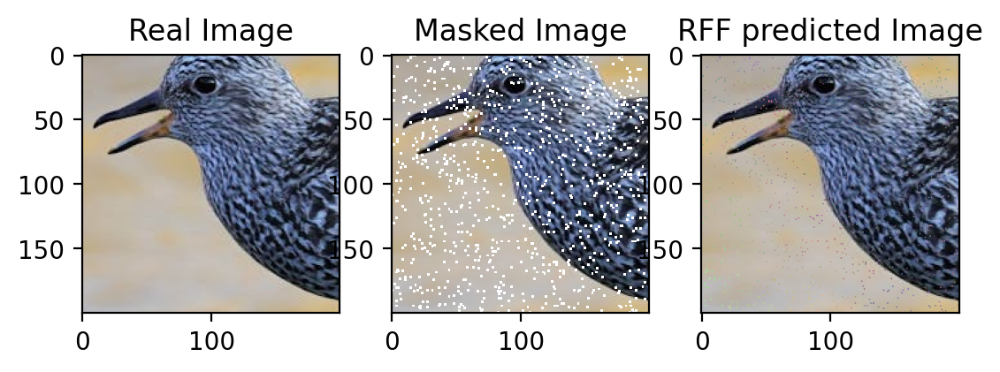

In [26]:
plt.tight_layout()

plt.subplot(1,3,1)
plt.imshow(c_img.permute(1,2,0))
plt.title("Real Image")
plt.subplot(1,3,2)
plt.imshow(m_img.permute(1, 2, 0).cpu().numpy() / 255)
plt.title("Masked Image")
plt.subplot(1,3,3)
plt.imshow(pred_img_rff)
plt.title("RFF predicted Image")

In [27]:
rmse_rff,psnr_rff = rmse_psnr(c_img.permute(1, 2, 0),pred_img_rff)
rmse_mf,psnr_mf = rmse_psnr(c_img.permute(1,2,0),img_rc)

C:\Users\Student\AppData\Local\Temp\ipykernel_42264\3025875977.py:13: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  psnr = 20 * np.log10(max_pixel_value / rmse)


Text(0.5, 1.0, 'RFF predict Image')

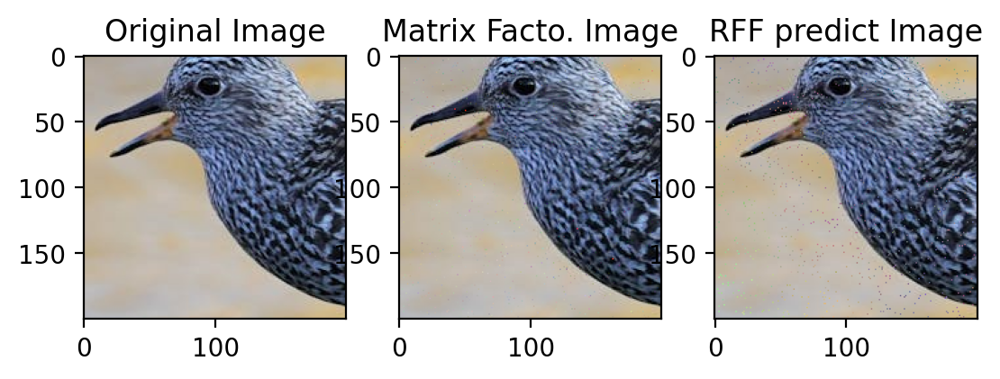

In [35]:
plt.tight_layout()

plt.subplot(1,3,1)
plt.imshow(c_img.permute(1, 2, 0),cmap='gray')
plt.title("Original Image")
plt.subplot(1,3,2)
plt.imshow(img_rc)
plt.title("Matrix Facto. Image")
plt.subplot(1,3,3)
plt.imshow(pred_img_rff)
plt.title("RFF predict Image")

In [29]:

print("For RFF")
print(f"rmse: {rmse_rff} , psnr: {psnr_rff}")
print("For Matrix Factorisation")
print(f"rmse: {rmse_mf} , psnr: {psnr_mf}")


For RFF
rmse: 7.594870090484619 , psnr: 30.520397186279297
For Matrix Factorisation
rmse: 3.6812667846679688 , psnr: 36.81085968017578


We can see that the Prediction using Matrix Factorisation is better than by using Random Fourier Features (RFF) and Linear Regression.
<br>
RMSE(Matrix Factorisation) < RMSE(RFF and Linear Regression)
<br>
PSNR(Matrix Factorisation) > PSNR(RFF and Linear Regression)